In [ ]:
#Instalações:
# !pip install pandas
# !pip install geopandas
# !pip install matplotlib
# !pip install shapely
# !pip install folium
# !pip install numpy
# !pip install seaborn

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import folium
import numpy as np
import seaborn as sns

In [34]:
caminho_arquivo = r'C:/Users/GuilhermeVideira/Documents/Python_Scripts/masterclass/br_rain_2010_2021.csv'

# Carregamento os dados do arquivo CSV em um DataFrame
dados = pd.read_csv(caminho_arquivo, sep = ',', encoding='latin-1')

dados.tail(10)

,Region,State,Area,Code,Lat,Lon,Alt,Year,Month,Rain (mm)
73981,TOME ACU,PA,Norte,A213,-2.592500,-48.360556,42.95,2019,5,829.6
73982,SANTA TERESA,ES,Sudeste,A613,-19.988333,-40.579444,988,2013,12,837.8
73983,AIMORES,MG,Sudeste,A534,-19.532778,-41.090833,83.74,2013,12,851.6
73984,BRAGANCA,PA,Norte,A226,-1.047258,-46.785790,41,2019,3,868.6
73985,APUI,AM,Norte,A113,-7.215278,-59.888611,160,2016,12,880.0
73986,SOURE,PA,Norte,A227,-0.811111,-48.515833,11,2012,3,881.0
73987,IMPERATRIZ,MA,Nordeste,A225,-5.555723,-47.459794,117.96,2020,3,898.6
73988,CAPELINHA,MG,Sudeste,A541,-17.705278,-42.389167,948,2013,12,930.4
73989,BELO HORIZONTE - CERCADINHO,MG,Sudeste,F501,-19.980000,-43.958611,1199.55,2020,1,967.0
73990,MANICORE,AM,Norte,A133,-5.810556,-61.291944,71,2017,3,1380.8


In [36]:
# Renomeando as colunas
renamed_columns = {
    'Region': 'Regiao',
    'State': 'Estado',
    'Area': 'Area',
    'Code': 'Código',
    'Lat': 'Latitude',
    'Lon': 'Longitude',
    'Alt': 'Altitude',
    'Year': 'Ano',
    'Month': 'Mes',
    'Rain (mm)': 'Chuva'
}

dados = dados.rename(columns=renamed_columns)
dados.head()

,Regiao,Estado,Area,Código,Latitude,Longitude,Altitude,Ano,Mes,Chuva
0,PEF IPIRANGA,AM,Norte,S102,-2.930556,-69.695278,F,2018,1,0.0
1,PEF YAUARETE,AM,Norte,S115,0.599444,-69.191944,F,2018,8,0.0
2,PACAJA,PA,Norte,A210,-3.843611,-50.638056,108,2011,5,0.0
3,PACAJA,PA,Norte,A210,-3.843611,-50.638056,108,2011,1,0.0
4,PEF IPIRANGA,AM,Norte,S102,-2.930556,-69.695278,F,2018,3,0.0


In [ ]:
# Cria uma lista de objetos Point a partir das colunas de longitude e latitude
geometria = [Point(lon, lat) for lon, lat in zip(dados['Longitude'], dados['Latitude'])]

# Adiciona a lista de geometria como uma nova coluna chamada 'geometry' no dataframe 'dados'
dados['geometry'] = geometria

# Cria um GeoDataFrame a partir do dataframe 'dados', utilizando a coluna 'geometry' como informação espacial
gdf = gpd.GeoDataFrame(dados, geometry='geometry')

In [38]:
gdf.head()

,Regiao,Estado,Area,Código,Latitude,Longitude,Altitude,Ano,Mes,Chuva,geometry
0,PEF IPIRANGA,AM,Norte,S102,-2.930556,-69.695278,F,2018,1,0.0,POINT (-69.69528 -2.93056)
1,PEF YAUARETE,AM,Norte,S115,0.599444,-69.191944,F,2018,8,0.0,POINT (-69.19194 0.59944)
2,PACAJA,PA,Norte,A210,-3.843611,-50.638056,108,2011,5,0.0,POINT (-50.63806 -3.84361)
3,PACAJA,PA,Norte,A210,-3.843611,-50.638056,108,2011,1,0.0,POINT (-50.63806 -3.84361)
4,PEF IPIRANGA,AM,Norte,S102,-2.930556,-69.695278,F,2018,3,0.0,POINT (-69.69528 -2.93056)


In [ ]:
estados = gpd.read_file(r'C:/Users/Guilherme Videira/Documents/Python_Scripts/masterclass/br_estados_BR.shp')

In [40]:
estados.head()

,nome,State,Region,Estado,geometry
0,RONDÔNIA,11.0,1.0,RO,"POLYGON ((-61.58313 -8.79869, -61.51372 -8.836..."
1,ACRE,12.0,1.0,AC,"POLYGON ((-66.81025 -9.81805, -66.62672 -9.898..."
2,AMAZONAS,13.0,1.0,AM,"POLYGON ((-63.37209 2.21186, -63.31079 2.16500..."
3,RORAIMA,14.0,1.0,RR,"POLYGON ((-58.89550 1.22769, -58.89556 0.59222..."
4,PARÁ,15.0,1.0,PA,"POLYGON ((-54.87225 2.43375, -54.87470 2.41533..."


C:\Users\Maria Fernanda\AppData\Roaming\Python\Python39\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

C:\Users\Maria Fernanda\anaconda3\lib\site-packages\descartes\patch.py:63: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



<AxesSubplot:>

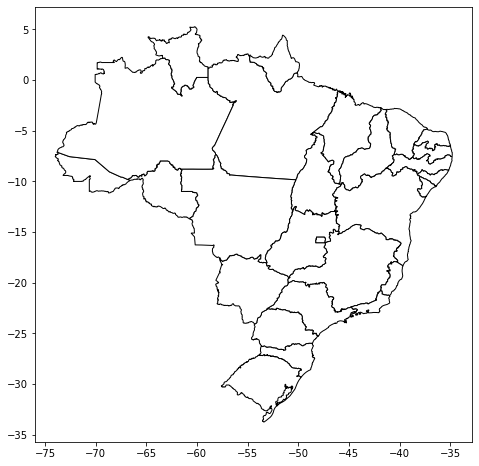

In [41]:
# Plote o mapa dos estados
fig, ax = plt.subplots(figsize=(10, 8))

estados.plot(ax=ax, color='white', edgecolor='black')



C:\Users\Maria Fernanda\AppData\Roaming\Python\Python39\site-packages\geopandas\plotting.py:33: ShapelyDeprecationWarning:

Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.

C:\Users\Maria Fernanda\anaconda3\lib\site-packages\descartes\patch.py:63: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



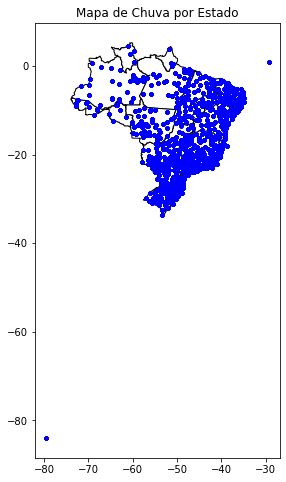

In [42]:
# Plote os pontos de chuva no mapa
# Plote o mapa dos estados
fig, ax = plt.subplots(figsize=(10, 8))

estados.plot(ax=ax, color='white', edgecolor='black')

gdf.plot(ax=ax, color='blue', markersize=10)


ax.set_title('Mapa de Chuva por Estado')
plt.show()


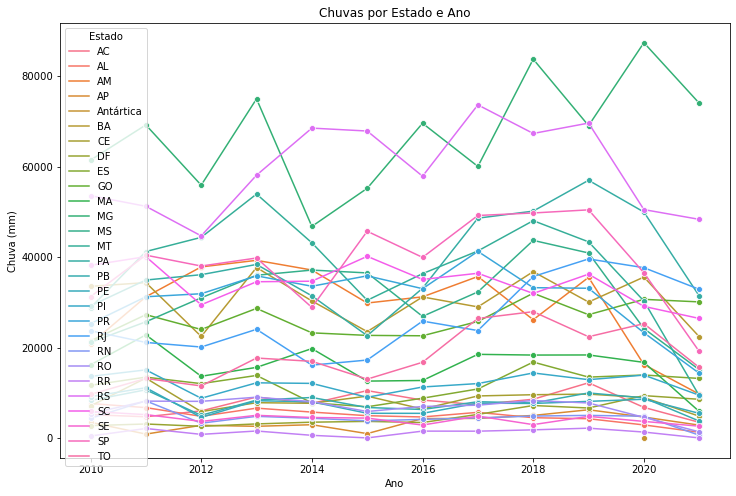

In [43]:
# Agrupa os dados por estado e ano e calcula a soma das chuvas
grouped_data = dados.groupby(['Estado', 'Ano'])['Chuva'].sum().reset_index()

# Plota o gráfico das chuvas por estado e por ano
fig, ax = plt.subplots(figsize=(12, 8))  # Cria uma figura e um objeto de eixos para o gráfico com o tamanho de 12 por 8
sns.lineplot(data=grouped_data, x='Ano', y='Chuva', hue='Estado', marker='o', ax=ax)  # Plota um gráfico de linhas usando os dados 'grouped_data', com 'Ano' no eixo x, 'Chuva' no eixo y, 'Estado' como cor de linha e marcadores 'o'

# Define o título e os rótulos dos eixos do gráfico
ax.set_title('Chuvas por Estado e Ano')  # Define o título do gráfico
ax.set_xlabel('Ano')  # Define o rótulo do eixo x
ax.set_ylabel('Chuva (mm)')  # Define o rótulo do eixo y

# Exibe o gráfico
plt.show()  # Mostra o gráfico na tela


In [44]:
import pandas as pd
import plotly.express as px #criação de gráficos interativos fornecida pelo Plotly.

# Agrupe os dados por estado e ano e calcule a soma das chuvas
grouped_data = dados.groupby(['Estado', 'Ano'])['Chuva'].sum().reset_index()

# Plote o gráfico das chuvas por estado e por ano
fig = px.line(grouped_data, x='Ano', y='Chuva', color='Estado', title='Chuvas por Estado e Ano',
              labels={'Ano', 'Chuva (mm)'}, hover_data=['Chuva'])
fig.update_traces(mode='markers+lines')

# Adicione as informações dos valores ao passar o mouse
fig.update_layout(hovermode='x unified')

fig.show()


In [45]:
fig_px = px.scatter_mapbox(dados, lat="Latitude", lon="Longitude",
                           hover_name="Area",
                           zoom=11, height=300)
fig_px.update_layout(mapbox_style="open-street-map",
                     margin={"r":0,"t":0,"l":0,"b":0})

fig_px.show()

In [46]:
import folium
from folium.plugins import HeatMap

# Cria um mapa centrado no Brasil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# Cria um DataFrame com a média de chuva para cada região
prec_media = dados.groupby(['Latitude', 'Longitude'])['Chuva'].mean().reset_index()

# Cria uma lista de localizações e suas médias de chuva
local = prec_media[['Latitude', 'Longitude']].values
variavel = prec_media['Chuva'].values

# Combina as localizações e pesos em uma única lista
data = list(zip(local[:, 0], local[:, 1], variavel)) #função zip() combina os elementos correspondentes de cada uma das colunas

# Adiciona um mapa de calor ao mapa
HeatMap(data, radius=15).add_to(m)

# Exibe o mapa
m

In [47]:
from branca.colormap import LinearColormap

# Create a map centered around Brazil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# Create a color map
colormap = LinearColormap(colors=['green', 'yellow', 'red'], vmin=prec_media['Chuva'].min(), vmax=prec_media['Chuva'].max())

# Add a marker for each region
for lat, lon, rain in zip(prec_media['Latitude'], prec_media['Longitude'], prec_media['Chuva']):
    folium.CircleMarker(
        location=[lat, lon],
        radius=rain/10,
        color=colormap(rain),
        fill=True,
        fill_color=colormap(rain)
    ).add_to(m)
m

In [16]:
# Create a DataFrame with the average rainfall for each region
prec_media = dados.groupby(['Regiao', 'Latitude', 'Longitude'])['Chuva'].mean().reset_index()

# Create a map centered around Brazil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)

# Add a marker for each region
for lat, lon, rain, region in zip(prec_media['Latitude'], prec_media['Longitude'], prec_media['Chuva'], prec_media['Regiao']):
    folium.Marker(
        location=[lat, lon],
        popup=f'Regiao: {region}<br>Average Rainfall: {rain}',
        icon=folium.Icon(color='red' if rain > prec_media['Chuva'].median() else 'green')
    ).add_to(m)

# Display the map
m

In [17]:
# Filter the data for the state of Rio de Janeiro
rj_data = dados[dados['Estado'] == 'RJ']

# Create a DataFrame with the average rainfall for each region in Rio de Janeiro
rj_prec_media = rj_data.groupby(['Regiao', 'Latitude', 'Longitude'])['Chuva'].mean().reset_index()

# Create a map centered around Rio de Janeiro
m = folium.Map(location=[-22.9068, -43.1729], zoom_start=7)

# Add a heat map to the map
HeatMap(rj_prec_media[['Latitude', 'Longitude', 'Chuva']].values.tolist(), radius=15).add_to(m)

# Add a marker for each region
for lat, lon, rain, region in zip(rj_prec_media['Latitude'], rj_prec_media['Longitude'], rj_prec_media['Chuva'], rj_prec_media['Regiao']):
    folium.Marker(
        location=[lat, lon],
        popup=f'Region: {region}<br>Average Rainfall: {rain}',
        icon=folium.Icon(color='red' if rain > rj_prec_media['Chuva'].median() else 'green')
    ).add_to(m)

# Display the map
m

In [18]:
# Create a map centered around Rio de Janeiro
m = folium.Map(location=[-22.9068, -43.1729], zoom_start=7)

# Add a heat map to the map
HeatMap(rj_prec_media[['Latitude', 'Longitude', 'Chuva']].values.tolist(), radius=15).add_to(m)

# Add a marker for each region
for lat, lon, rain, region in zip(rj_prec_media['Latitude'], rj_prec_media['Longitude'], rj_prec_media['Chuva'], rj_prec_media['Regiao']):
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        popup=f'Region: {region}<br>Average Rainfall: {rain}'
    ).add_to(m)

# Display the map
m

In [19]:
import folium
from folium.plugins import HeatMap

# Obtém a lista de estados únicos
estados_unicos = dados['Estado'].unique()

# Itera sobre cada estado
for estado in estados_unicos:
    # Filtra os dados apenas para o estado atual
    dados_estado = dados[dados['Estado'] == estado]
    
    # Cria um DataFrame com a média de chuva para cada região do estado
    precp_media = dados_estado.groupby(['Latitude', 'Longitude'])['Chuva'].mean().reset_index()
    
    # Cria um mapa centrado no estado atual
    state_map = folium.Map(location=[dados_estado['Latitude'].mean(), dados_estado['Longitude'].mean()], zoom_start=10)
    
    # Cria uma lista de localizações e suas médias de chuva
    local = precp_media[['Latitude', 'Longitude']].values
    variavel = precp_media['Chuva'].values
    
    # Combina as localizações e pesos em uma única lista
    data = list(zip(local[:, 0], local[:, 1], variavel))
    
    # Adiciona um mapa de calor ao mapa do estado atual
    HeatMap(data, radius=15).add_to(state_map)
    
    # Exibe o mapa do estado atual
    display(state_map)
